In [53]:
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Dense, InputLayer
from keras.optimizers import Adam
from sklearn.metrics import r2_score

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import seaborn as sns
import missingno as msno


print(f'tf_version: {tf.__version__}')

tf_version: 2.13.0


In [72]:
# Loading the dataset
original_df = pd.read_csv('./data/CalifornianHousing.csv', sep=',')
df = original_df.copy()
display(df.head())

target = 'median_house_value' 
features = [i for i in df.columns if i not in target]

display(df.describe().transpose())

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY


,count,mean,std,min,25%,50%,75%,max
longitude,20640.0,-119.569704,2.003532,-124.3500,-121.8000,-118.4900,-118.01000,-114.3100
latitude,20640.0,35.631861,2.135952,32.5400,33.9300,34.2600,37.71000,41.9500
housing_median_age,20640.0,28.639486,12.585558,1.0000,18.0000,29.0000,37.00000,52.0000
total_rooms,20640.0,2635.763081,2181.615252,2.0000,1447.7500,2127.0000,3148.00000,39320.0000
total_bedrooms,20433.0,537.870553,421.385070,1.0000,296.0000,435.0000,647.00000,6445.0000
population,20640.0,1425.476744,1132.462122,3.0000,787.0000,1166.0000,1725.00000,35682.0000
households,20640.0,499.539680,382.329753,1.0000,280.0000,409.0000,605.00000,6082.0000
median_income,20640.0,3.870671,1.899822,0.4999,2.5634,3.5348,4.74325,15.0001
median_house_value,20640.0,206855.816909,115395.615874,14999.0000,119600.0000,179700.0000,264725.00000,500001.0000


## Exploratory Data Analysis

### Missing Values and Duplicates

,Number of Missing Values,% Missing
longitude,0,0.000000
latitude,0,0.000000
housing_median_age,0,0.000000
total_rooms,0,0.000000
total_bedrooms,207,1.002907
population,0,0.000000
households,0,0.000000
median_income,0,0.000000
median_house_value,0,0.000000
ocean_proximity,0,0.000000


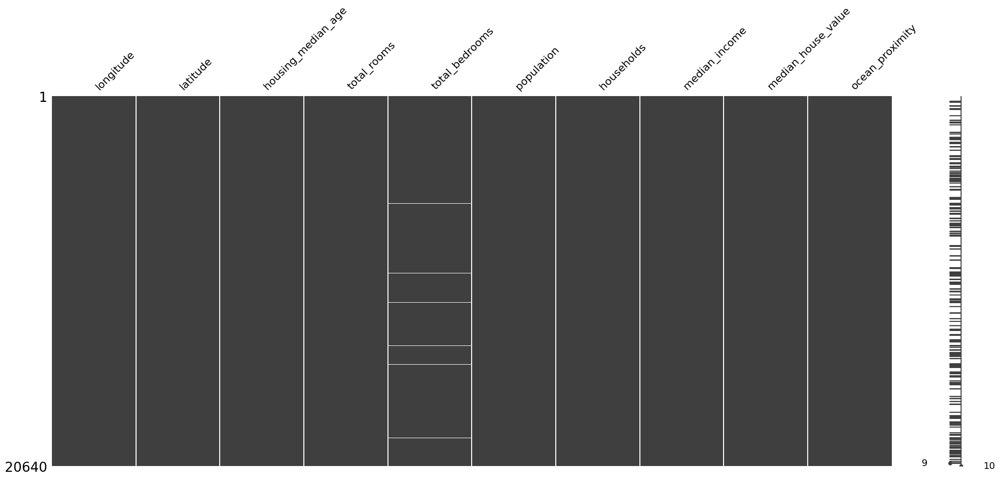

In [7]:
# Checking for missing values
df_nulls = pd.DataFrame(df.isnull().sum(), columns=['Number of Missing Values'])
df_nulls['% Missing'] = df.isnull().sum() * 100 / len(df)
display(df_nulls)

msno.matrix(df) # Plot missing values matrix

#Showing missing data with heatmap before droping 
# plt.figure(figsize=(10,6))
# sns.heatmap(df.isna().transpose());

df.dropna(thresh = 9,inplace=True) # Removes rows with less than 9 valid features

In [11]:
print('Number of duplicates: ', df.duplicated().sum())

Number of duplicates:  0


### Outliers

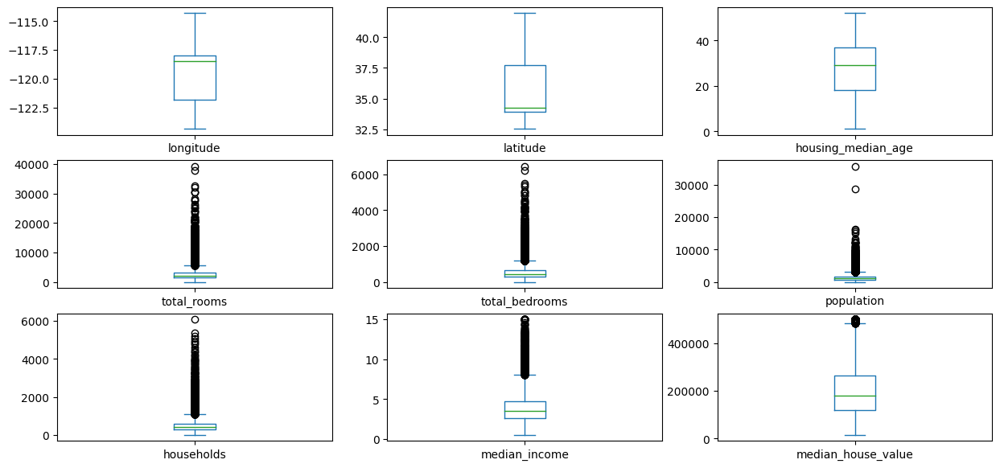

In [98]:
def boxplot_matrix_plotly(df):
    _x = 1
    _y = 1
    _rows = 3
    _cols = 3

    fig = make_subplots(
        rows=_rows, cols=_cols,
        subplot_titles=features)

    for i in features: 
        if _x > _rows: 
            _x = 1
            _y += 1 
        if i == 'ocean_proximity':
            fig.add_trace(go.Box(x=df[i], y=df['median_house_value'], name='median_house_value'),
                        row=_x, col=_y)
        else:
            fig.add_trace(go.Box(y=df[i], name=i),
                        row=_x, col=_y)
        _x += 1

    fig.update_layout(height=800, width=1225,
                    title_text="Multiple Subplots with Titles")

    fig.update_traces(dict(line=dict(width=1, color="darkslategrey")))

    return fig

fig = boxplot_matrix_plotly(df)
fig.show()

# Pandas boxplot matrix
df.plot(kind='box', subplots=True, layout=(3,3), figsize=(15,7))
plt.show()

/home/matsouto/Code/Py/ML/Supervised Learning/.venv/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


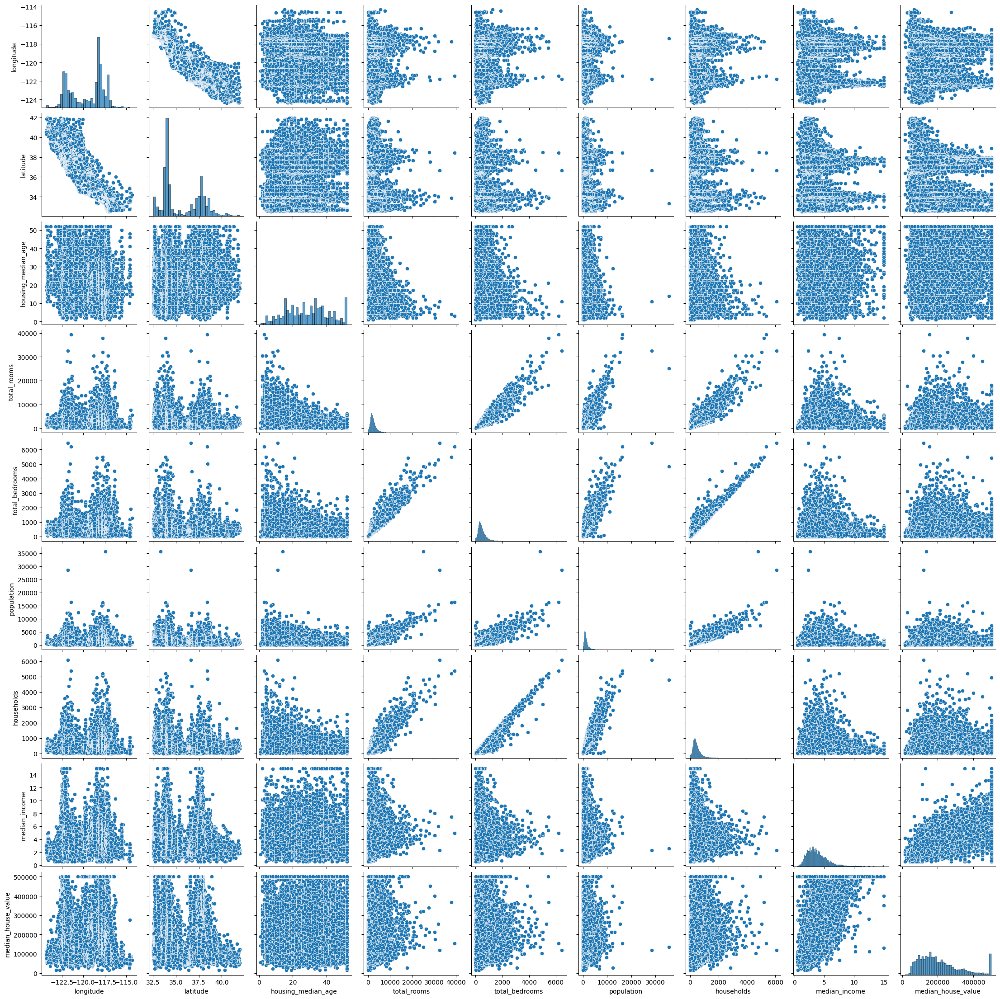

In [8]:
# Pairplot

g = sns.pairplot(data=df)
# g.map_upper(sns.kdeplot, levels=4, color="tab:blue")

# Using plotly
# fig = px.scatter_matrix(df, 
#                         dimensions=df.copy().drop(columns='ocean_proximity').columns, 
#                         labels={col:col.replace('_', ' ') for col in df.columns}) # remove underscore
# fig.update_traces(marker=dict(size=1, line=dict(width=1, color="darkslategrey")))
# fig.update_traces(diagonal_visible=False)
# fig.show()

### Geographical Plots

In [155]:
fig = px.scatter(df, x='longitude', y='latitude', size='population',color='median_house_value', color_continuous_scale='plasma')
fig.show()

In [156]:
fig = px.density_mapbox(df, lat='latitude', lon='longitude', z='median_house_value', radius=5,
                        hover_data=["median_income", "housing_median_age"],
                        center=dict(lat=37, lon=-120), zoom=4,
                        mapbox_style="stamen-terrain",
                        color_continuous_scale='plasma')

# fig.update_layout(
#     mapbox_style="white-bg",
#     mapbox_layers=[
#         {
#             "below": 'traces',
#             "sourcetype": "raster",
#             "sourceattribution": "United States Geological Survey",
#             "source": [
#                 "https://basemap.nationalmap.gov/arcgis/rest/services/USGSImageryOnly/MapServer/tile/{z}/{y}/{x}"
#             ]
#         }
#       ],
      
#     mapbox_bounds={"west": -180, "east": -50, "south": 20, "north": 90})

fig.show()

### Correlation Analysis

In [157]:
fig = px.scatter(df, x='housing_median_age', y='median_house_value', size='total_rooms', color='median_income', marginal_x="histogram", labels={col:col.replace('_', ' ') for col in df.columns}) 
fig.show()

fig = px.scatter(df, x="median_income", y="median_house_value", facet_col="ocean_proximity",labels={col:col.replace('_', ' ') for col in df.columns})
fig.update_traces(marker=dict(size=1, line=dict(width=1, color="darkslategrey")))
fig.show()

## Data Preprocessing

### Data Preparation 



In [ ]:
ocean_proximity_labels = df['ocean_proximity'].unique()
print('Ocean Proximity Labels: ', ocean_proximity_labels)

# Maps the labels from ocean proximity to integers
df['ocean_proximity'] = df['ocean_proximity'].map({'NEAR BAY' : 1, '<1H OCEAN' : 2, 'INLAND' : 3, 'NEAR OCEAN' : 4, 'ISLAND' : 5}) 
df.head()

In [ ]:
target = 'median_house_value'
features = [i for i in df.columns if i not in target]

x_train_df = df[features]
y_train_df = df[target]
x_train_np = x_train_df.to_numpy()
y_train_np = y_train_df.to_numpy()
print(f'x_train shape: {x_train_np.shape} \t y_train shape: {y_train_np.shape}')

### Feature Scalling
In order to make the training algorithm faster, we normalize the inputs using Keras Normalization layer

In [14]:
print('Before Normalization:')
print(f'Peak-to-peak x_train: {np.ptp(x_train_np, axis=0)}')
display(pd.DataFrame(x_train_np, columns=x_train_df.columns).describe())

# Creating the normalization layer
norm_1 = tf.keras.layers.Normalization(axis=-1) 
# Does the same as passing mean and variance in layer construction
norm_1.adapt(x_train_np) 

# Foward propagating x_train
x_train_norm = norm_1(x_train_np)

print('\nAfter Normalization:')
print(f'Peak-to-peak x_train: {np.ptp(x_train_norm, axis=0)}')
display(pd.DataFrame(x_train_norm, columns=x_train_df.columns).describe())

Before Normalization:
Peak-to-peak x_train: [1.00400e+01 9.41000e+00 5.10000e+01 3.93180e+04 3.56790e+04 6.08100e+03
 1.45002e+01]


,longitude,latitude,housing_median_age,total_rooms,population,households,median_income
count,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,-119.569704,35.631861,28.639486,2635.763081,1425.476744,499.539680,3.870671
std,2.003532,2.135952,12.585558,2181.615252,1132.462122,382.329753,1.899822
min,-124.350000,32.540000,1.000000,2.000000,3.000000,1.000000,0.499900
25%,-121.800000,33.930000,18.000000,1447.750000,787.000000,280.000000,2.563400
50%,-118.490000,34.260000,29.000000,2127.000000,1166.000000,409.000000,3.534800
75%,-118.010000,37.710000,37.000000,3148.000000,1725.000000,605.000000,4.743250
max,-114.310000,41.950000,52.000000,39320.000000,35682.000000,6082.000000,15.000100



After Normalization:
Peak-to-peak x_train: [ 5.0112433  4.4056435  4.0523643 18.022873  31.50648   15.905506
  7.6325846]


,longitude,latitude,housing_median_age,total_rooms,population,households,median_income
count,20640.000000,20640.000000,2.064000e+04,2.064000e+04,2.064000e+04,2.064000e+04,2.064000e+04
mean,-0.000024,-0.000013,6.091687e-07,1.787215e-07,5.899474e-07,4.967978e-07,4.790550e-07
std,1.000018,1.000026,1.000025e+00,1.000025e+00,1.000025e+00,1.000024e+00,1.000024e+00
min,-2.386002,-1.447583,-2.196181e+00,-1.207283e+00,-1.256123e+00,-1.303983e+00,-1.774299e+00
25%,-1.113228,-0.796803,-8.453930e-01,-5.445699e-01,-5.638088e-01,-5.742290e-01,-6.881181e-01
50%,0.538888,-0.642302,2.864635e-02,-2.332104e-01,-2.291314e-01,-2.368157e-01,-1.767946e-01
75%,0.778467,0.972945,6.643113e-01,2.348031e-01,2.644958e-01,2.758432e-01,4.593068e-01
max,2.625242,2.958060,1.856183e+00,1.681559e+01,3.025036e+01,1.460152e+01,5.858286e+00


### Tiling

Tile/copy our data to increase the training set size and reduce the number of training epochs.

In [16]:
x_train = np.tile(x_train_norm, (1, 1)) # Repeat 1000 times the rows while keeping the columns.
y_train = np.tile(y_train_np, (1, 1))

print(f'x_train shape before: {x_train_norm.shape}')
print(f'x_train shape after: {x_train.shape}')

x_train shape before: (20640, 7)
x_train shape after: (20640, 7)


## Model Training

### Deep Feed Foward Model Training

![Alt text](images/dff.png)

In [25]:
nn_dff = Sequential([
  InputLayer(input_shape=(x_train.shape[1],)), # This layer can be omitted 
  Dense(units=512, kernel_initializer='normal', activation='relu', name='layer_1'),
  Dense(units=512, kernel_initializer='normal', activation='relu', name='layer_2'),
  Dense(units=256, kernel_initializer='normal', activation='relu', name='layer_3'),
  Dense(units=1, kernel_initializer='normal', activation='linear', name='layer_4')
], name = 'DFF_model')

display(nn_dff.summary()) # The parameter counts correspond to the number of elements in the weight and bias.

Model: "DFF_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 layer_1 (Dense)             (None, 512)               4096      
                                                                 
 layer_2 (Dense)             (None, 512)               262656    
                                                                 
 layer_3 (Dense)             (None, 256)               131328    
                                                                 
 layer_4 (Dense)             (None, 1)                 257       
                                                                 
Total params: 398337 (1.52 MB)
Trainable params: 398337 (1.52 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


None

In [27]:
# Defines loss function and optimizer
nn_dff.compile( 
    loss = 'mse', # Mean squared error
    optimizer = Adam(learning_rate=0.01),
)

# Runs gradient descent and fits the weights to the data
nn_dff.fit(
    x_train,y_train,            
    epochs=10,
    batch_size=64,
    validation_split = 0.2,
)

Epoch 1/10
258/258 [==============================] - 4s 12ms/step - loss: 3537142528.0000 - val_loss: 4848321536.0000
Epoch 2/10
258/258 [==============================] - 3s 12ms/step - loss: 3545070336.0000 - val_loss: 4762434048.0000
Epoch 3/10
258/258 [==============================] - 3s 12ms/step - loss: 3524618496.0000 - val_loss: 4957874176.0000
Epoch 4/10
258/258 [==============================] - 3s 12ms/step - loss: 3411921408.0000 - val_loss: 4797066752.0000
Epoch 5/10
258/258 [==============================] - 3s 12ms/step - loss: 3334303232.0000 - val_loss: 4752423424.0000
Epoch 6/10
258/258 [==============================] - 3s 12ms/step - loss: 3333467904.0000 - val_loss: 4874754048.0000
Epoch 7/10
258/258 [==============================] - 3s 12ms/step - loss: 3210423552.0000 - val_loss: 4693102080.0000
Epoch 8/10
258/258 [==============================] - 3s 12ms/step - loss: 3175397888.0000 - val_loss: 4777957888.0000
Epoch 9/10
258/258 [============================

In [30]:
p_dff = nn_dff.predict(x_train_norm)
print(nn_dff.get_layer('layer_4').get_weights()[0].shape)
print('Prediction on training set: \n', p_dff[:5,:], '\n')
print('Target values: \n', y_train_np[:5,:], '\n')
print('Model accuracy (delta <= 10000): %f'%(np.mean(np.abs(p_dff - y_train_np) <= 10000)))
print(f'R2 Score: {r2_score(y_train_np, p_dff)}\n')

645/645 [==============================] - 2s 3ms/step
(256, 1)
Prediction on training set: 
 [[396437.88]
 [420844.06]
 [383401.66]
 [309534.72]
 [263788.97]] 

Target values: 
 [[452600.]
 [358500.]
 [352100.]
 [341300.]
 [342200.]] 

Model accuracy (delta <= 10000): 0.210029
R2 Score: 0.7416812055664426



### Conclusion:

The model performed better with the loss set to mean squared error.
